# Импорт библиотек

In [2]:
!pip install -qqq torchmetrics[detection]

In [3]:
# based on https://www.kaggle.com/konstanter/fasterrcnn-pytorch-maskdetection

import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import os
import shutil
import time
import xml.etree.ElementTree as et
from sklearn.model_selection import train_test_split

import torch
import torchvision
from torchvision import transforms, datasets, models
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchmetrics.detection.mean_ap import MeanAveragePrecision
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
import cv2

from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Faster R-CNN ResNet50 FPN v2

Для данного задания из семейства Faster R-CNN в PyTorch доступны следующие предобученные модели:

* FASTERRCNN_RESNET50_FPN (базовая модель)
* FASTERRCNN_RESNET50_FPN_V2 (улучшеннная FASTERRCNN_RESNET50_FPN)
* FASTERRCNN_MOBILENET_V3_LARGE_FPN (backbone MobileNet позволяет использовать для обработки видео)
* FASTERRCNN_MOBILENET_V3_LARGE_320_FPN (оптимизирована для мобильных устройств)

Для нашего проекта выберем модель FASTERRCNN_RESNET50_FPN_V2, поскольку она предполагает лучшее качество детектирования объектов.

## Загрузка данных в DataLoader

In [4]:
# путь к файлам
images_dir = '/kaggle/input/face-mask-detection/images/'
annotations_dir = '/kaggle/input/face-mask-detection/annotations/'


class FaceMaskDataset(torch.utils.data.Dataset):

    def __init__(self, images_dir, annotation_dir, width, height, transforms=None):
        self.transforms = transforms
        self.images_dir = images_dir
        self.annotation_dir = annotation_dir
        self.height = height
        self.width = width
        
        # сортировка изображений
        self.imgs = [image for image in sorted(os.listdir(images_dir))]
        self.annotate = [image for image in sorted(os.listdir(annotation_dir))]
        
        # на 0й позиции находится фон
        self.classes = [_, 'without_mask','with_mask','mask_weared_incorrect']

    def __getitem__(self, idx):

        img_name = self.imgs[idx]
        image_path = os.path.join(self.images_dir, img_name)

        # изменение цвета и размера изображения    
        img = cv2.imread(image_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
        img_res = cv2.resize(img_rgb, (self.width, self.height), cv2.INTER_AREA)
        # нормализация изображения
        img_res /= 255.0
        
        # аннотация
        annot_filename = self.annotate[idx]
        annot_file_path = os.path.join(self.annotation_dir, annot_filename)
        
        boxes = []
        labels = []
        tree = et.parse(annot_file_path)
        root = tree.getroot()
        
        # высота и ширина изображения
        wt = img.shape[1]
        ht = img.shape[0]
        
        # ограничивающие рамки
        for member in root.findall('object'):
            labels.append(self.classes.index(member.find('name').text))
            
            # bounding box
            xmin = int(member.find('bndbox').find('xmin').text)
            xmax = int(member.find('bndbox').find('xmax').text)
            
            ymin = int(member.find('bndbox').find('ymin').text)
            ymax = int(member.find('bndbox').find('ymax').text)
            
            
            xmin_corr = (xmin/wt)*self.width
            xmax_corr = (xmax/wt/1.003)*self.width
            ymin_corr = (ymin/ht)*self.height
            ymax_corr = (ymax/ht)*self.height
            
            boxes.append([xmin_corr, ymin_corr, xmax_corr, ymax_corr])
        
        # перевод boxes в формат torch.Tensor
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])

        iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)
        
        labels = torch.as_tensor(labels, dtype=torch.int64)


        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd

        image_id = torch.tensor([idx])
        target["image_id"] = image_id


        if self.transforms:
            
            sample = self.transforms(image = img_res,
                                     bboxes = target['boxes'],
                                     labels = labels)
            
            img_res = sample['image']
            target['boxes'] = torch.Tensor(sample['bboxes'])
            
            
            
        return img_res, target

    def __len__(self):
        return len(self.imgs)


# проверка датасета
dataset = FaceMaskDataset(images_dir, annotations_dir, 224, 224)
print('length of dataset = ', len(dataset), '\n')

img, target = dataset[78]
print('Image shape = ', img.shape, '\n','Target - ', target)

length of dataset =  853 

Image shape =  (224, 224, 3) 
 Target -  {'boxes': tensor([[113.1163, 146.7200, 163.2312, 205.5200]]), 'labels': tensor([2]), 'area': tensor([2946.7593]), 'iscrowd': tensor([0]), 'image_id': tensor([78])}


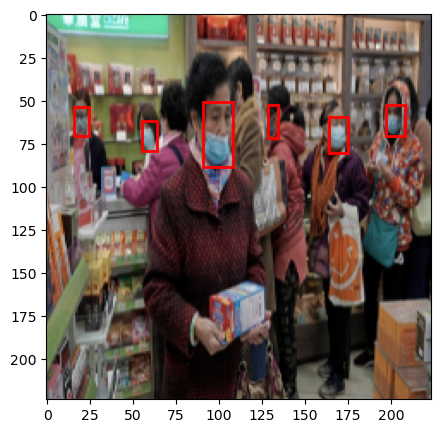

In [5]:
# Вспомогательная функция для визуализации bbox

def plot_img_bbox(img, target):
    fig, ax = plt.subplots(figsize=(5,5), ncols=1)
    ax.imshow(img)
    ax.axis('scaled')
    for box in (target['boxes']):
        x, y, width, height = box[0], box[1], box[2]-box[0], box[3]-box[1]
        rect = patches.Rectangle((x, y),
                                 width, height,
                                 linewidth = 2,
                                 edgecolor = 'r',
                                 facecolor = 'none')

        # Отрисуем bbox поверх картинки
        ax.add_patch(rect)
    plt.show()
    
img, target = dataset[35]
plot_img_bbox(img, target)

In [6]:
def get_transform(train):
    
    if train:
        return A.Compose([
#                             A.HorizontalFlip(0.5),
#                             A.RandomBrightnessContrast(p=0.2),
#                             A.ShiftScaleRotate(shift_limit=0.2, scale_limit=0.2, rotate_limit=30, p=0.5),
                            ToTensorV2(p=1.0) 
                        ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})
    else:
        return A.Compose([
                            ToTensorV2(p=1.0)
                        ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})

In [7]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [8]:
dataset = FaceMaskDataset(images_dir, annotations_dir, 600, 600, transforms= get_transform(train=True))
dataset_test = FaceMaskDataset(images_dir, annotations_dir, 600, 600, transforms= get_transform(train=False))

# разделим данные на train и test
torch.manual_seed(1)
indices = torch.randperm(len(dataset)).tolist()

test_split = 0.2
tsize = int(len(dataset)*test_split)
dataset = torch.utils.data.Subset(dataset, indices[:-tsize])
dataset_test = torch.utils.data.Subset(dataset_test, indices[-tsize:])

data_loader = torch.utils.data.DataLoader(
    dataset, batch_size=10, shuffle=True, num_workers=2,
    collate_fn=collate_fn)

data_loader_test = torch.utils.data.DataLoader(
    dataset_test, batch_size=10, shuffle=False, num_workers=2,
    collate_fn=collate_fn)

## Обучение модели

In [9]:
# Берем наиболее совершенную модель из семейства FasterRCNN

def get_model_instance(num_classes):
    
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn_v2(weights='COCO_V1')
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    return model

In [10]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

num_classes = 4
num_epochs = 40
frcnn_df = pd.DataFrame()

model = get_model_instance(num_classes)
model.to(device)

params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                                momentum=0.9, weight_decay=0.0005)

lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=3,
                                               gamma=0.1)
len_dataloader = len(data_loader)

start_time = time.time()

for epoch in range(num_epochs):
    model.train()  # Training model
    epoch_loss = 0
    for imgs, annotations in data_loader:
        imgs = list(img.to(device) for img in imgs)
        annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]
        loss_dict = model(imgs, annotations)
        losses = sum(loss for loss in loss_dict.values())
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()         
        epoch_loss += losses.item()
    print(f'Epoch: {epoch}, total loss: {epoch_loss}')
    
    model.eval()  # Validating model
    metric = MeanAveragePrecision(box_format="xyxy", class_metrics=False)
    with torch.no_grad():
        for imgs, annotations in data_loader_test:
            imgs = list(img.to(device) for img in imgs)
            annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]
            preds = model(imgs)
            metric.update(preds, annotations)
    metric_res = metric.compute()
    metric_res = {k: v.detach().numpy() for k, v in metric_res.items()}
    metric_res['classes'] = ['all']
    metric_res['epoch'] = [epoch]
    frcnn_df = pd.concat([frcnn_df, pd.DataFrame(metric_res)])

duration = time.time() - start_time
print('Время обучения: {:.0f}m {:.0f}s'.format(duration // 60, duration % 60))

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth
100%|██████████| 167M/167M [00:00<00:00, 190MB/s]  
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 0, total loss: 38.839397221803665


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 1, total loss: 21.395536333322525


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 2, total loss: 16.817315973341465


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 3, total loss: 14.433269165456295


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 4, total loss: 13.72534130513668


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 5, total loss: 11.84902023524046


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 6, total loss: 10.824541538953781


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 7, total loss: 9.836127940565348


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 8, total loss: 9.016474392265081


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 9, total loss: 8.019272595643997


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 10, total loss: 7.856624219566584


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 11, total loss: 7.303228296339512


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 12, total loss: 6.744144789874554


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 13, total loss: 6.45618113130331


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 14, total loss: 6.362101063132286


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 15, total loss: 5.933580841869116


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 16, total loss: 5.4071185775101185


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 17, total loss: 5.139448657631874


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 18, total loss: 4.764164928346872


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 19, total loss: 4.645126223564148


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 20, total loss: 4.46939486078918


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 21, total loss: 4.344396883621812


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 22, total loss: 4.1940911412239075


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 23, total loss: 4.060848830267787


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 24, total loss: 3.8919104654341936


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 25, total loss: 3.9799908362329006


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 26, total loss: 3.7375157196074724


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 27, total loss: 3.687508761882782


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 28, total loss: 3.553205143660307


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 29, total loss: 3.331237306818366


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 30, total loss: 3.246156293898821


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 31, total loss: 3.247572012245655


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 32, total loss: 3.1136023215949535


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 33, total loss: 3.0616375226527452


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 34, total loss: 3.010702535510063


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 35, total loss: 3.015685772523284


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 36, total loss: 3.059245051816106


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 37, total loss: 2.9340980909764767


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 38, total loss: 2.819338076747954


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


Epoch: 39, total loss: 2.6727956011891365
Время обучения: 78m 2s


In [11]:
frcnn_df

,map,map_50,map_75,map_small,map_medium,map_large,mar_1,mar_10,mar_100,mar_small,mar_medium,mar_large,map_per_class,mar_100_per_class,classes,epoch
0,0.462168,0.559563,0.514619,0.691544,0.689553,0.400550,0.188974,0.558541,0.716963,0.692863,0.791405,0.656545,-1.0,-1.0,all,0
0,0.558282,0.652034,0.601496,0.696582,0.766983,0.520149,0.209858,0.583156,0.729215,0.697023,0.784738,0.677372,-1.0,-1.0,all,1
0,0.619022,0.711558,0.685347,0.721351,0.812410,0.551061,0.251026,0.637351,0.784405,0.722371,0.834597,0.799230,-1.0,-1.0,all,2
0,0.632639,0.723971,0.704744,0.764661,0.835036,0.506286,0.271356,0.670503,0.819569,0.768746,0.859300,0.832891,-1.0,-1.0,all,3
0,0.671079,0.769220,0.744247,0.711204,0.843428,0.683317,0.293007,0.665028,0.807170,0.711465,0.863551,0.895812,-1.0,-1.0,all,4
0,0.675960,0.767530,0.737061,0.742556,0.809211,0.727160,0.309881,0.656835,0.797342,0.746033,0.825759,0.884493,-1.0,-1.0,all,5
0,0.670566,0.758652,0.735443,0.735637,0.824612,0.756454,0.284906,0.661031,0.799727,0.739236,0.842960,0.897803,-1.0,-1.0,all,6
0,0.660836,0.745204,0.730769,0.727063,0.793096,0.750830,0.283846,0.643879,0.780162,0.730923,0.805154,0.888047,-1.0,-1.0,all,7
0,0.676597,0.760291,0.744925,0.724092,0.797945,0.763658,0.305752,0.649240,0.783178,0.727598,0.810468,0.904394,-1.0,-1.0,all,8
0,0.680554,0.773476,0.758970,0.754455,0.794976,0.775816,0.309691,0.656667,0.787481,0.755354,0.803673,0.906293,-1.0,-1.0,all,9


<Axes: title={'center': 'FasterRCNNv2 mAP_50'}, xlabel='epoch'>

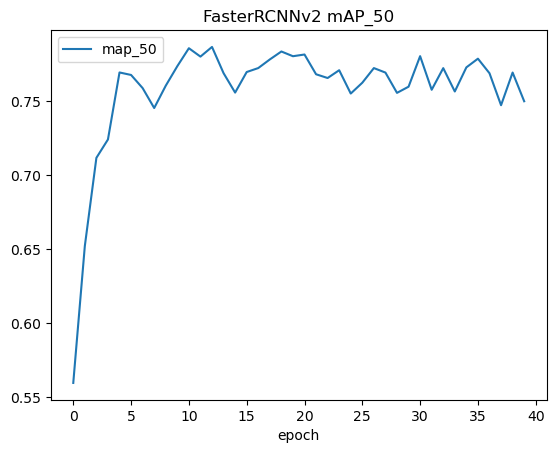

In [12]:
frcnn_df.plot(x='epoch', y='map_50', kind='line', title='FasterRCNNv2 mAP_50')

In [13]:
# вспомогательная функция принимает исходный прогноз и порог iou

def apply_nms(orig_prediction, iou_thresh=0.3):
    
    keep = torchvision.ops.nms(orig_prediction['boxes'], orig_prediction['scores'], iou_thresh)
    
    final_prediction = orig_prediction
    final_prediction['boxes'] = final_prediction['boxes'][keep]
    final_prediction['scores'] = final_prediction['scores'][keep]
    final_prediction['labels'] = final_prediction['labels'][keep]
    
    return final_prediction

def torch_to_pil(img):
    return transforms.ToPILImage()(img).convert('RGB')

In [14]:
img, target = dataset_test[4]

model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])[0]
    
print('predicted #boxes: ', len(prediction['labels']))
print('real #boxes: ', len(target['labels']))

predicted #boxes:  1
real #boxes:  1


EXPECTED OUTPUT


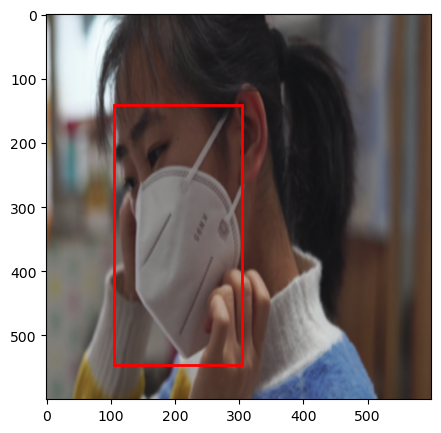

In [15]:
print('EXPECTED OUTPUT')
plot_img_bbox(torch_to_pil(img), target)

MODEL OUTPUT


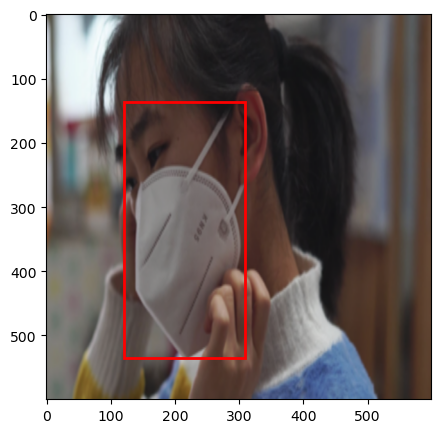

In [16]:
print('MODEL OUTPUT')
plot_img_bbox(torch_to_pil(img), {k: v.to('cpu') for k, v in prediction.items()})

NMS APPLIED MODEL OUTPUT


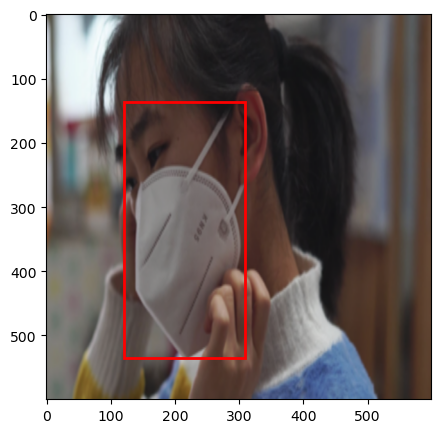

In [17]:
nms_prediction = apply_nms(prediction, iou_thresh=0.2)
print('NMS APPLIED MODEL OUTPUT')
plot_img_bbox(torch_to_pil(img), {k: v.to('cpu') for k, v in nms_prediction.items()})

## Визуализация результатов

In [18]:
def plot_image(img_tensor, annotation, predict=True):
    
    fig, ax = plt.subplots(1)
    fig.set_size_inches(12.5, 6.5)
    img = img_tensor.cpu().data
    mask_dic = {1:'without_mask', 2:'with_mask', 3:'mask_weared_incorrect'}
    color_dict = {'without_mask': 'r', 'with_mask': 'g', 'mask_weared_incorrect': 'y'}

    ax.imshow(img.permute(1, 2, 0))
    ax.set_title('Prediction' if predict else 'Target')
    
    annotation = {k: v.detach().to('cpu') for k, v in annotation.items()}
    
    for i,box in enumerate(annotation["boxes"]):
        
        xmin, ymin, xmax, ymax = box
        label = mask_dic[int(annotation['labels'][i].data)]

        rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor=color_dict[label],facecolor='none')

        ax.add_patch(rect)
        
        if predict:
            score = int((annotation['scores'][i].data) * 100)
            ax.text(xmin, ymin, f"{score}%", horizontalalignment='center', verticalalignment='center',fontsize=20,color=color_dict[label])
    plt.show()

In [19]:
for imgs, annotations in data_loader:
        imgs = list(img.to(device) for img in imgs)
        annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]
        break

In [20]:
with torch.no_grad():
    preds = model(imgs)

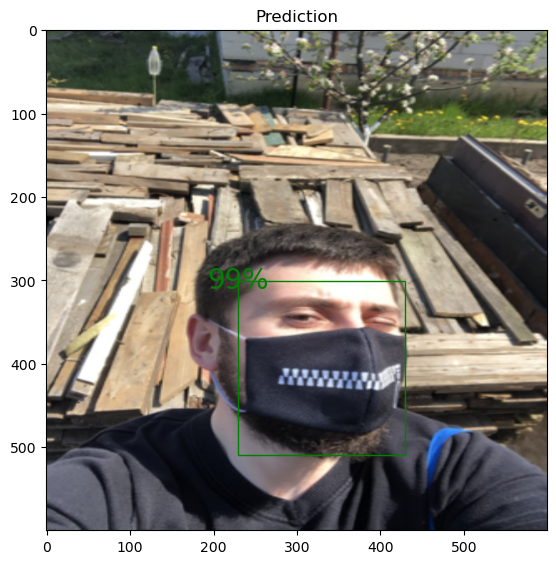

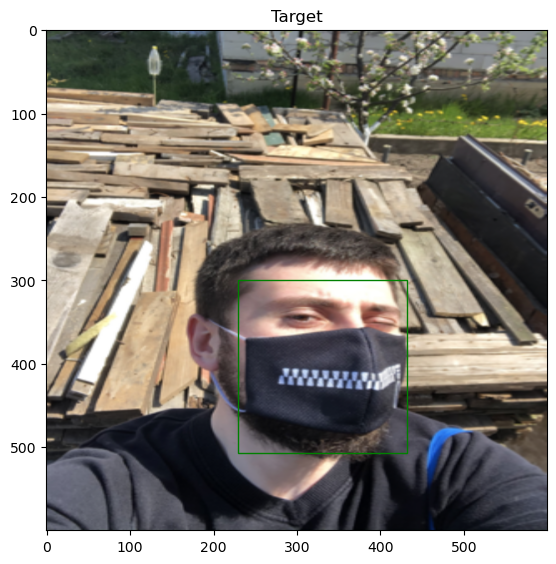

In [21]:
nms_prediction = apply_nms(preds[4], iou_thresh=0.2)
plot_image(imgs[4], nms_prediction)
plot_image(imgs[4].to('cpu'), annotations[4], False)

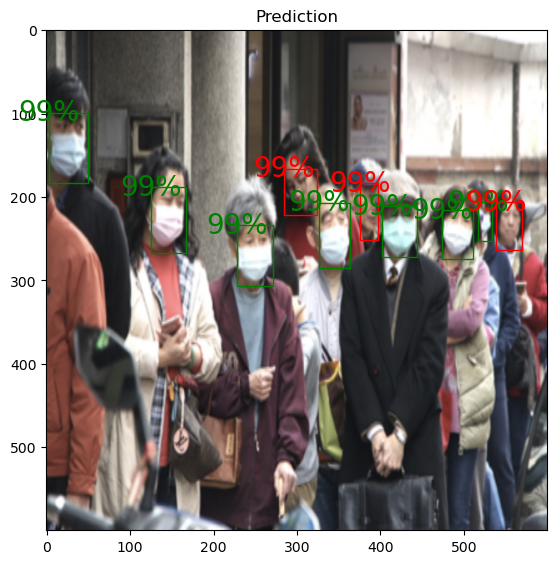

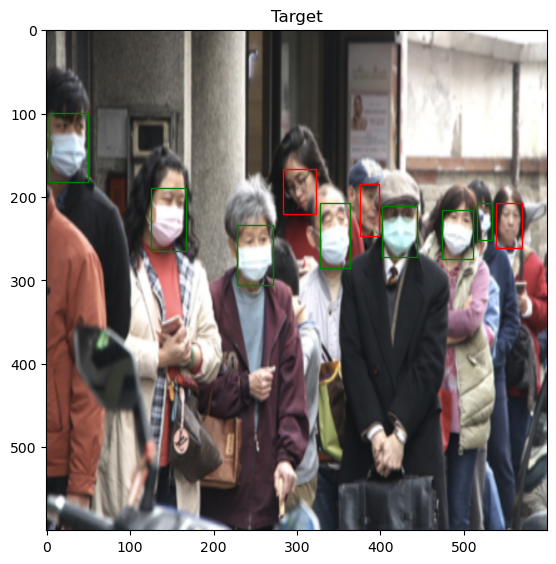

In [22]:
nms_prediction = apply_nms(preds[7], iou_thresh=0.2)
plot_image(imgs[7], nms_prediction)
plot_image(imgs[7].to('cpu'), annotations[7],False)

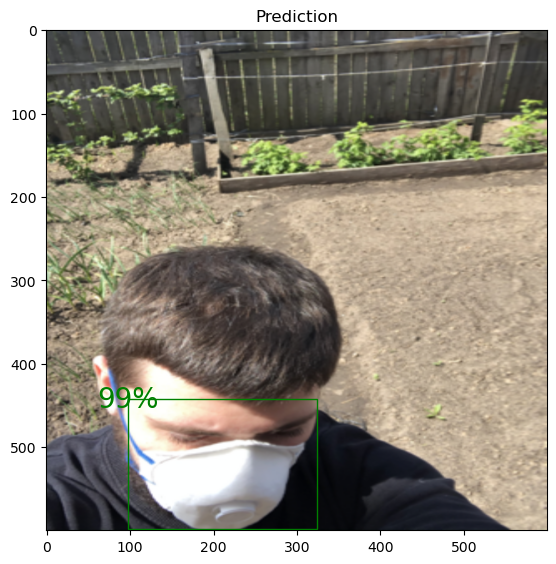

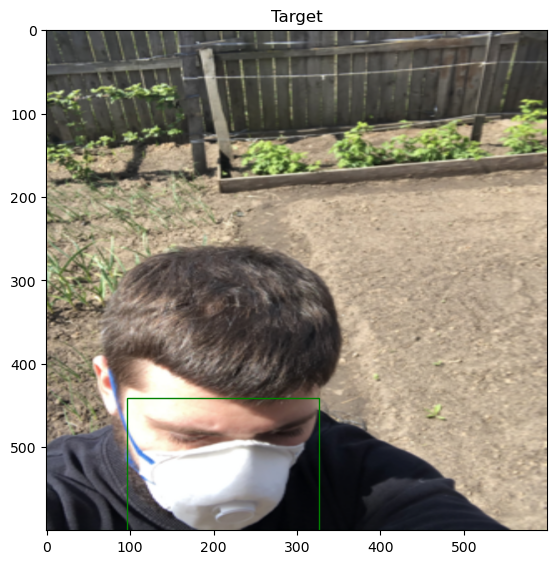

In [23]:
nms_prediction = apply_nms(preds[0], iou_thresh=0.2)
plot_image(imgs[0], nms_prediction)
plot_image(imgs[0].to('cpu'), annotations[0],False)

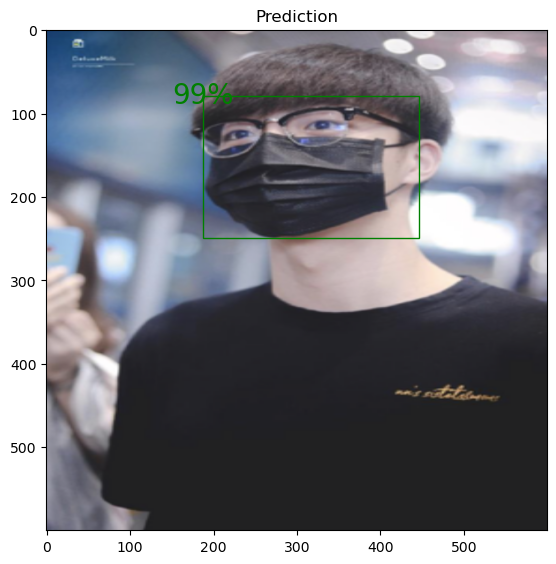

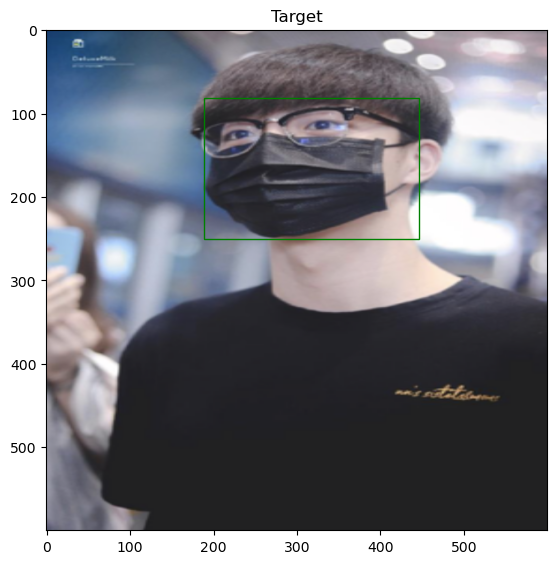

In [24]:
nms_prediction = apply_nms(preds[2], iou_thresh=0.2)
plot_image(imgs[2], nms_prediction)
plot_image(imgs[2].to('cpu'), annotations[2],False)

# YOLOv8

Для данного задания из семейства YOLO будем использовать модель YOLOv8 как самую современную и совершенную из существующих.

## Создание датасета

In [28]:
def xml_to_yolo(xml_path):
    """
    Функция для чтения файла аннотации в XML формате с
    последующим преобразованием в YOLO формат. В качестве
    входного параметра принимает путь к файлу.
    Возвращает данные, подготовленные для записи в файл.
    """
    bboxes = []
    label_to_id = {'without_mask': 0,'with_mask': 1,'mask_weared_incorrect': 2}
    tree = et.parse(xml_path)
    root = tree.getroot()
    size = root.find('size')
    w = int(size.find('width').text)
    h = int(size.find('height').text)
    # Проходим по всем объектам в файле аннотации
    for obj in root.findall('object'):
        label = obj.find('name').text
        bndbox_tree = obj.find('bndbox')
        x_min = int(bndbox_tree.find('xmin').text)
        y_min = int(bndbox_tree.find('ymin').text)
        x_max = int(bndbox_tree.find('xmax').text)
        y_max = int(bndbox_tree.find('ymax').text)
        
        # Конвертируем координаты в формат YOLO
        x_center = (x_max + x_min) / (2 * w)
        y_center = (y_max + y_min) / (2 * h)
        width = (x_max - x_min) / w
        height = (y_max - y_min) / h
        bboxes.append('{} {:.3f} {:.3f} {:.3f} {:.3f}'.format(label_to_id[label], x_center, y_center, width, height))
    return bboxes


def create_yolo_dataset(input_path, save_path, images, data_type):
    """
    Функция для создания датасета для модели YOLO с конвертацией
    аннотаций из формата PASCAL VOC.
    Входные параметры:
    input_path - путь к директории с файлами изображений и аннотаций
    save_path - путь к директории создаваемого датасета
    images - список файлов изображений для датасета
    data_type - тип данных (train/val)
    """

    img_dest_dir = os.path.join(save_path, 'images', data_type)
    lbl_dest_dir = os.path.join(save_path, 'labels', data_type)
    os.makedirs(img_dest_dir)
    os.makedirs(lbl_dest_dir)
    for img in images:
        shutil.copy(os.path.join(input_path, 'images', img), img_dest_dir)
        ann_path = os.path.join(input_path, 'annotations', img.replace('png', 'xml'))
        bboxes = xml_to_yolo(ann_path)
        lbl_path = os.path.join(lbl_dest_dir, img.replace('png', 'txt'))
        with open(lbl_path, 'w') as f:
            f.write('\n'.join(bboxes))

In [29]:
# Создадим датасет для модели YOLO
source_dir = '/kaggle/input/face-mask-detection'
images_dir = os.path.join(source_dir, 'images')
dest_dir = 'datasets/facemask'

imgs = [img for img in sorted(os.listdir(images_dir))]

imgs_train, imgs_val = train_test_split(imgs, test_size=0.2, random_state=1)

create_yolo_dataset(source_dir, dest_dir, imgs_train, data_type='train')
create_yolo_dataset(source_dir, dest_dir, imgs_val, data_type='val')

# Создадим конфигурационный файл для датасета
facemask_yaml = f"""
    path: facemask
    train: images/train
    val: images/val
    names:
        0: without_mask
        1: with_mask
        2: mask_weared_incorrect
    """

with open('facemask.yaml', 'w') as f:
    f.write(facemask_yaml)

## Обучение модели

In [30]:
!pip install -qqq ultralytics

In [31]:
from ultralytics import YOLO, settings

settings.update({'wandb': False})  # Отключаем логирование Weights & Biases

model = YOLO("yolov8s.pt")
start_time = time.time()
model.train(data="facemask.yaml", epochs=num_epochs, batch=16, imgsz=600, cache=True, val=True, exist_ok=True, verbose = False)
duration = time.time() - start_time
print('Время обучения: {:.0f}m {:.0f}s'.format(duration // 60, duration % 60))

100%|██████████| 21.5M/21.5M [00:01<00:00, 20.6MB/s]
Ultralytics YOLOv8.0.146 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=facemask.yaml, epochs=40, patience=50, batch=16, imgsz=600, save=True, save_period=-1, cache=True, device=None, workers=8, project=None, name=None, exist_ok=True, pretrained=True, optimizer=auto, verbose=False, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=F

Время обучения: 14m 20s


## Визуализация результатов

In [32]:
# Метрики обучения
yolo_df = pd.read_csv('/kaggle/working/runs/detect/train/results.csv', sep=',\s+', engine='python')
yolo_df

,epoch,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,0,1.70560,2.24540,1.49100,0.50836,0.47778,0.49647,0.29284,1.28080,1.84370,1.2091,0.000465,0.000465,0.000465
1,1,1.32320,1.02800,1.14940,0.68670,0.54363,0.59591,0.36478,1.23740,0.97265,1.2157,0.000918,0.000918,0.000918
2,2,1.27740,0.93168,1.14140,0.63511,0.57456,0.53115,0.33822,1.21980,1.50250,1.1958,0.001348,0.001348,0.001348
3,3,1.22180,0.90006,1.13420,0.65647,0.57976,0.60412,0.40331,1.18510,1.04880,1.1770,0.001323,0.001323,0.001323
4,4,1.19880,0.83279,1.12030,0.70215,0.61032,0.67811,0.45130,1.13770,0.81128,1.1433,0.001323,0.001323,0.001323
5,5,1.17410,0.78958,1.09350,0.84722,0.59260,0.70686,0.45881,1.19070,0.78148,1.1444,0.001288,0.001288,0.001288
6,6,1.18520,0.75319,1.08860,0.74923,0.63687,0.68344,0.45536,1.07100,0.71193,1.0713,0.001252,0.001252,0.001252
7,7,1.15310,0.73389,1.09460,0.76401,0.69124,0.74970,0.51729,1.06910,0.65871,1.1044,0.001217,0.001217,0.001217
8,8,1.13760,0.71245,1.09210,0.67107,0.68874,0.67327,0.45239,1.09580,0.72675,1.1193,0.001181,0.001181,0.001181
9,9,1.15110,0.70546,1.05870,0.81520,0.71589,0.78175,0.52666,1.07730,0.64010,1.0975,0.001146,0.001146,0.001146


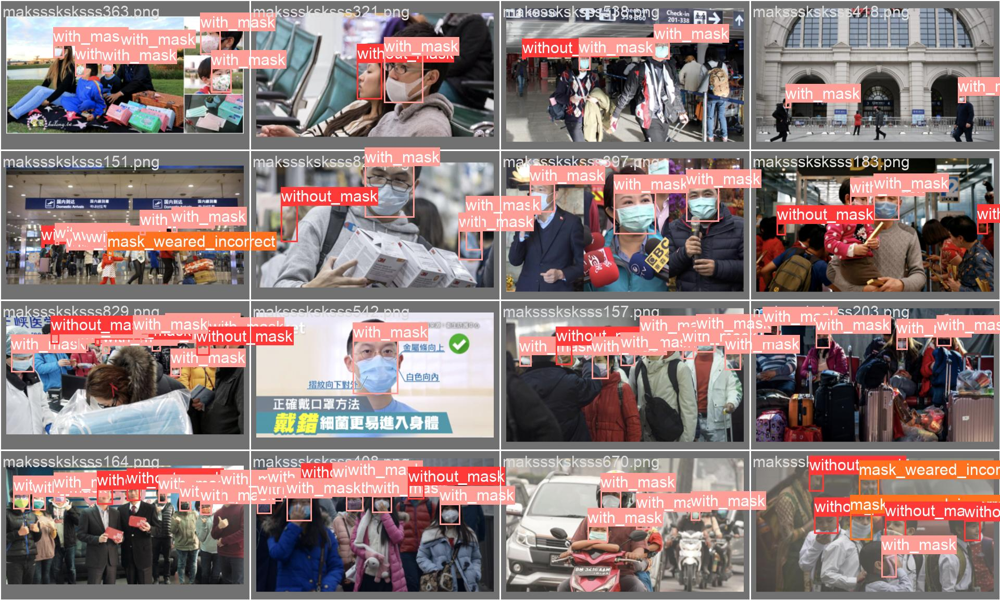

In [33]:
# Батч с размеченными данными
img = Image.open('/kaggle/working/runs/detect/train/val_batch0_labels.jpg')
display(img)

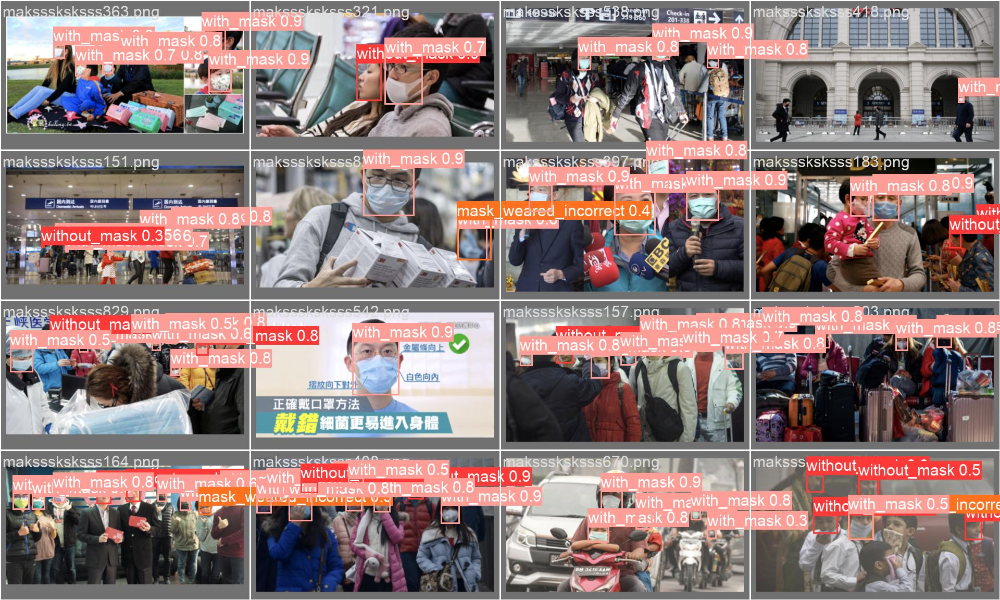

In [34]:
# Батч с предсказаниями
img = Image.open('/kaggle/working/runs/detect/train/val_batch0_pred.jpg')
display(img)

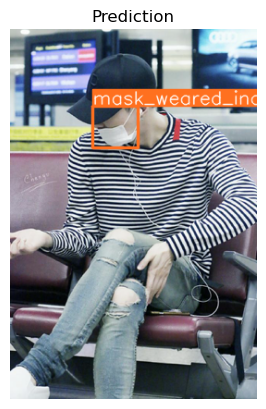

In [35]:
# Предсказание обученной моделью
im1 = Image.open('/kaggle/working/datasets/facemask/images/val/maksssksksss112.png')
results = model.predict(source=im1, iou=0.2)
res_plotted = results[0].plot()
plt.imshow(cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB))
plt.title("Prediction")
plt.axis(False)
plt.show()

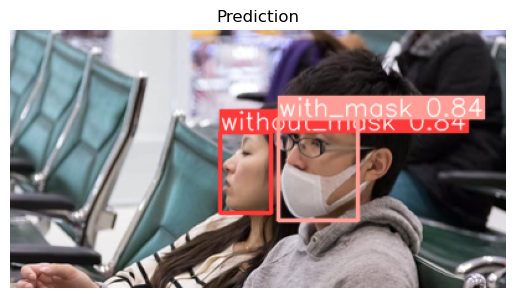

In [36]:
# Предсказание обученной моделью
im2 = Image.open('/kaggle/working/datasets/facemask/images/val/maksssksksss321.png')
results = model.predict(source=im2, iou=0.2)
res_plotted = results[0].plot()
plt.imshow(cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB))
plt.title("Prediction")
plt.axis(False)
plt.show()

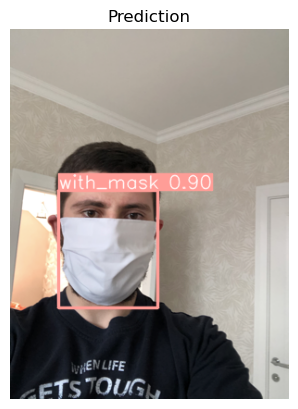

In [37]:
# Предсказание обученной моделью
im3 = Image.open('/kaggle/working/datasets/facemask/images/val/maksssksksss686.png')
results = model.predict(source=im3, iou=0.2)
res_plotted = results[0].plot()
plt.imshow(cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB))
plt.title("Prediction")
plt.axis(False)
plt.show()

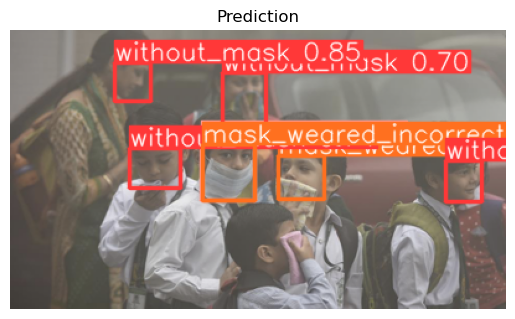

In [38]:
# Предсказание обученной моделью
im4 = Image.open('/kaggle/working/datasets/facemask/images/val/maksssksksss760.png')
results = model.predict(source=im4, iou=0.2)
res_plotted = results[0].plot()
plt.imshow(cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB))
plt.title("Prediction")
plt.axis(False)
plt.show()

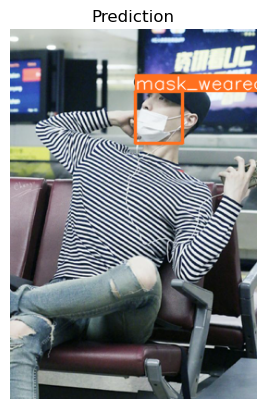

In [39]:
# Предсказание обученной моделью
im5 = Image.open('/kaggle/working/datasets/facemask/images/val/maksssksksss761.png')
results = model.predict(source=im5, iou=0.2)
res_plotted = results[0].plot()
plt.imshow(cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB))
plt.title("Prediction")
plt.axis(False)
plt.show()

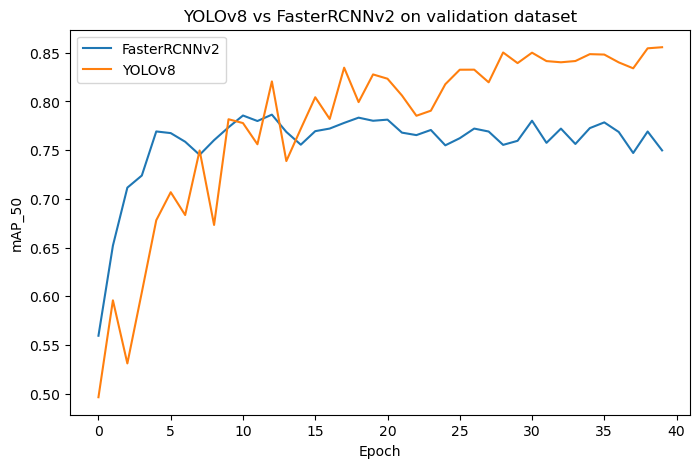

In [40]:
# Сравниваем метрику mAP_50 для обеих моделей

yolo_df = pd.read_csv('/kaggle/working/runs/detect/train/results.csv', sep=',\s+', engine='python')

fig, ax = plt.subplots(figsize=(8, 5))
ax.plot(frcnn_df['epoch'], frcnn_df['map_50'], label='FasterRCNNv2')
ax.plot(yolo_df['epoch'], yolo_df['metrics/mAP50(B)'], label='YOLOv8')
ax.set_xlabel('Epoch')
ax.set_ylabel('mAP_50')
ax.legend()
ax.set_title('YOLOv8 vs FasterRCNNv2 on validation dataset')
plt.show()

In [41]:
# Наилучшие значения mAP_50 для каждой из моделей
print('FasterRCNNv2 mAP_50 max: {:.3f}'.format(frcnn_df['map_50'].max()))
print('YOLOv8 mAP_50 max: {:.3f}'.format(yolo_df['metrics/mAP50(B)'].max()))

FasterRCNNv2 mAP_50 max: 0.786
YOLOv8 mAP_50 max: 0.856
